In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [ ]:
import numpy as np
import numpy.random as npr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.model_selection import KFold
import pickle
from scipy import stats

from imports import *
from config import main_config, dir_config
from src.utils import pmf_utils, glm_hmm_utils

In [ ]:
compiled_dir = Path(dir_config.data.compiled)
processed_dir = Path(dir_config.data.processed)

prior_colors = main_config.colors.prior_colors
block_colors = main_config.colors.block_colors
state_colors = main_config.colors.state_colors

In [4]:
_TRIALS = "masked"
# _TRIALS = "masked_eq_prior_only"
# _TRIALS = "masked_uneq_prior_only"
# _TRIALS = "masked_no_bias"

In [5]:
data_path = f"glm_hmm_{_TRIALS}.pkl"

_EQUAL_ONLY = "_eq_prior_only" in _TRIALS
_UNEQUAL_ONLY = "_uneq_prior_only" in _TRIALS
no_bias = "_no_bias" in _TRIALS
n_trial_back = 1

### Helper functions

In [ ]:
def get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices):

    transition_matrix = model.transitions.params
    transition_matrix = np.exp(transition_matrix)[0]
    weights = -model.observations.params
    posterior_probs, weighted_sum = [], []
    for idx in trial_indices:
        posterior_probs.append(model.expected_states(data=choices[idx], input=input[idx], mask=np.array(mask[idx]).reshape(-1, 1))[0])
        weighted_sum.append(np.sum(weights * input[idx][None, :, :], axis=-1).T)
    sigmoid_output = 1 / (1 + np.exp(-np.concatenate(weighted_sum)))
    glm_hmm_expected_choice_prob = np.sum(sigmoid_output * np.concatenate(posterior_probs), axis=1, keepdims=True)

    posterior_cols = [f"posterior_probs_state_{i}" for i in range(1,1+np.concatenate(posterior_probs).shape[1])]

    df = pd.DataFrame(
        data = np.hstack((
            np.concatenate(trial_indices).reshape(-1,1),  # shape (n_trials, 1)
            np.concatenate(posterior_probs),               # shape (n_trials, n_states)
            glm_hmm_expected_choice_prob,  # shape (n_trials, 1)
            mask[np.concatenate(trial_indices)].values.reshape(-1, 1),  # shape (n_trials, 1)
            choices[np.concatenate(trial_indices)].reshape(-1, 1),  # shape (n_trials, 1)
            stimulus[np.concatenate(trial_indices)].values.reshape(-1, 1),  # shape (n_trials, 1)
            input[np.concatenate(trial_indices),0].reshape(-1, 1)
        )),
        columns = ["trial_idx"] + posterior_cols + ["expected_choice_prob"] + ["mask"] + ["choices"] + ["stimulus"] + ["normalized_stimulus"]
    )
    df = df[df["mask"] == 1]  # include valid trials only
    df = df.drop(columns=["mask"])


    return df

In [ ]:
def plot_psych(predicted_df, task_switch, ax, n_sample=10):
    # plot equal and unequal psychometric fits
    equal_indices = predicted_df["trial_idx"] < task_switch
    unequal_indices = predicted_df["trial_idx"] >= task_switch

    for indices, color, label in zip([equal_indices, unequal_indices], ["#377eb8", "#974810"], ["Equal", "Unequal"]):
        if label == "Equal" and _UNEQUAL_ONLY:
            continue
        if label == "Unequal" and _EQUAL_ONLY:
            continue

        stimulus = predicted_df["stimulus"][indices]
        choices = predicted_df["choices"][indices]
        expected_choice_probs = predicted_df["expected_choice_prob"][indices]

        data = {"signed_coherence": np.array(stimulus) * 100, "choice": choices}
        x_data, y_data, model, x_model, y_model = pmf_utils.get_psychometric_data(data)

        x_model_hat, y_model_hat = np.full((n_sample, len(x_model)), np.nan), np.full((n_sample, len(y_model)), np.nan)

        for idx_sample in range(n_sample):
            data_fitted = {"signed_coherence": np.array(stimulus) * 100, "choice": npr.binomial(1, expected_choice_probs)}
            x_data, _, _, x_model_hat[idx_sample, :], y_model_hat[idx_sample, :] = pmf_utils.get_psychometric_data(data_fitted)


        ax.plot(x_data, y_data, "o", color=color)

        ax.plot(x_model, y_model, color=color, label=label)
        ax.plot(np.mean(x_model_hat, axis=0), np.mean(y_model_hat, axis=0), color=color, linestyle="--")
        ax.fill_between(np.mean(x_model_hat, axis=0), np.mean(y_model_hat, axis=0) - np.std(y_model_hat, axis=0), np.mean(y_model_hat, axis=0) + np.std(y_model_hat, axis=0), color=color, alpha=0.3)

    ax.set_xlim(min(x_data), max(x_data))
    ax.set_ylim(0,1)
    ax.set_xlabel("Coherence")
    ax.set_ylabel("choices toRF")
    ax.set_title("Psychometric fits", fontsize=15)
    ax.legend()


In [ ]:
def plot_state_prob(predicted_df, task_switch, ax):
    color = ["#ff7f00", "#4daf4a", "#377eb8"]
    # find out number of columns start with posterior_probs_state_
    posterior_cols = [col for col in predicted_df.columns if col.startswith("posterior_probs_state_")]
    for col_idx, col in enumerate(posterior_cols):
        ax.scatter(predicted_df["trial_idx"], predicted_df[col], s=1, color=color[col_idx])
        ax.plot([],[], color=color[col_idx], label=f"State {col_idx+1}")
    ax.set_xlabel("Trial #")
    ax.set_ylabel("Posterior Probability")
    ax.set_title("State Posterior Probabilities", fontsize=15)
    ax.vlines(task_switch, ymin=-0.1, ymax=1.1, color="k", alpha=0.5, ls="--")
    ax.set_ylim(-0.1, 1.1)
    ax.legend()


In [ ]:
def plot_model_params(model, axs):
    """
    Plot the model parameters: GLM weights and transition matrix.
    """
    color = ["#ff7f00", "#4daf4a", "#377eb8"]  # Colors for the states
    transition_matrix = model.transitions.params
    transition_matrix = np.exp(transition_matrix)[0]
    weights = -model.observations.params

    # Plot GLM weights
    for idx in range(weights.shape[0]):
        axs[0].plot(np.arange(weights.shape[2]), weights[idx][0], marker="o", color=color[idx], linestyle="-", lw=1.5, label=f"State {idx + 1}")

    axs[0].tick_params(axis="y", labelsize=10)
    axs[0].set_ylabel("GLM weight", fontsize=15)
    axs[0].set_xlabel("covariate", fontsize=15)
    labels = ["Stimulus", "Bias"] \
        + [f"Prev Choice"] \
        + [f"Prev Target"]
    axs[0].set_xticks(range(2+2*n_trial_back))
    axs[0].set_xticklabels(labels, fontsize=12, rotation=15)

    axs[0].axhline(y=0, color="k", alpha=0.5, ls="--")
    axs[0].legend()
    axs[0].set_title("GLM weights", fontsize=15)

    # Plot transition matrix
    axs[1].imshow(transition_matrix, vmin=-0.8, vmax=1, cmap="bone")
    for i in range(transition_matrix.shape[0]):
        for j in range(transition_matrix.shape[1]):
            axs[1].text(j, i, f"{transition_matrix[i, j]:.10f}", ha="center", va="center", color="k", fontsize=12)

    axs[1].set_ylim(weights.shape[0] - 0.5, -0.5)
    axs[1].set_title("Transition Matrix", fontsize=15)
    axs[1].set_xlabel("State t+1", fontsize=15)
    axs[1].set_ylabel("State t", fontsize=15)

### Load Data

In [10]:
with open(Path(processed_dir, data_path), "rb") as f:
	glm_hmm = pickle.load(f)

session_metadata = pd.read_csv(Path(processed_dir, "sessions_metadata.csv"))

### Best fold for each session

In [39]:
if _EQUAL_ONLY:
    best_state_idx = 0
else:
    best_state_idx = 1

best_state = best_state_idx + 1

In [40]:
best_fold_session_wise = []
for session in range(glm_hmm["session_wise"]["test_ll"].shape[0]):
	best_fold_session_wise.append(np.argmax(glm_hmm["session_wise"]["test_ll"][session, best_state_idx, :]))

### Get train/test  split for each session

In [41]:
from src.utils.glm_hmm_utils_cv import cross_validation_split
train_fold, test_fold = {}, {}

for idx_session, session in enumerate(session_metadata["session_id"]):
	choices = glm_hmm["data"][session]["choices"]
	best_fold = best_fold_session_wise[idx_session]

	train_indices, test_indices = cross_validation_split(len(choices), idx_split=best_fold)
	# Store the train and test indices for the current session
	train_fold[session] = train_indices
	test_fold[session] = test_indices

## Model fits and data recovery (train and test)

### Train Dataset

#### Psychometric Fits, GLM weights, transition matrix, p(state)

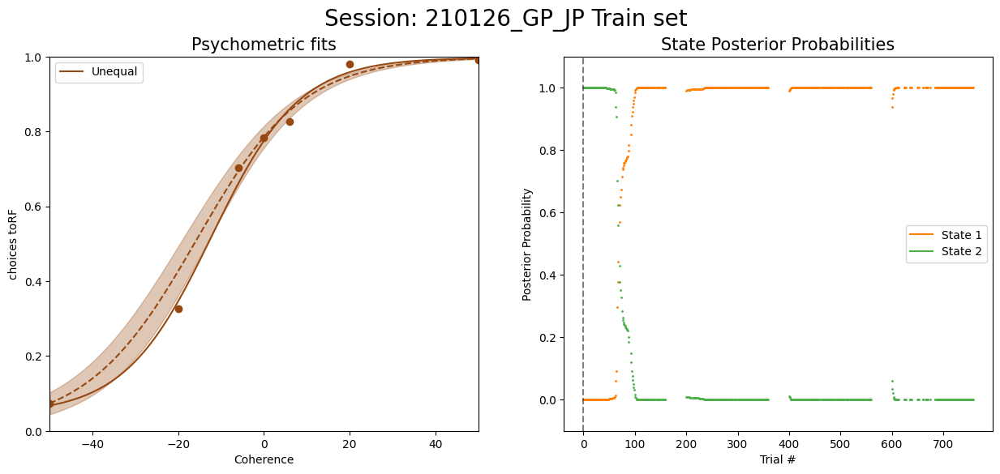

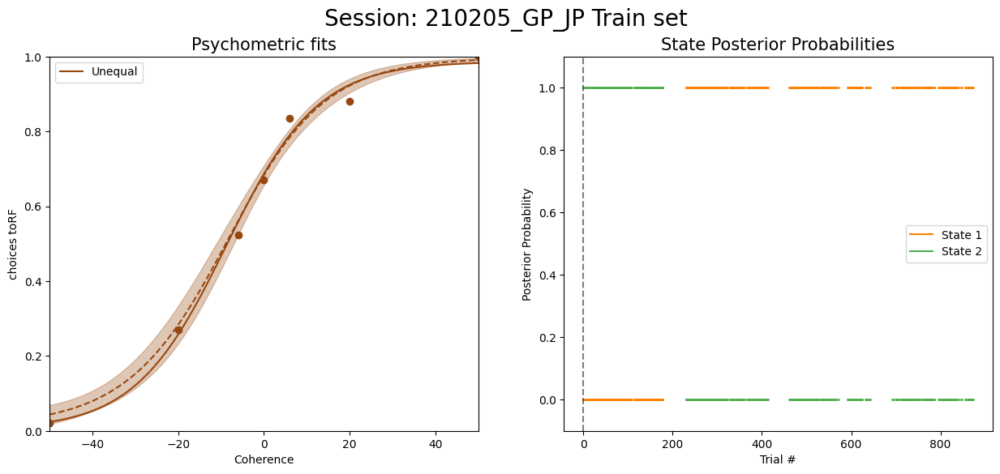

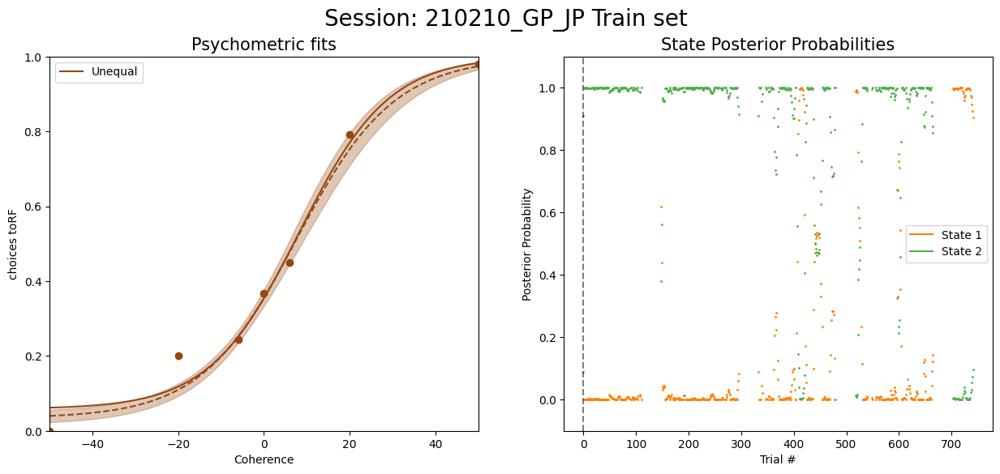

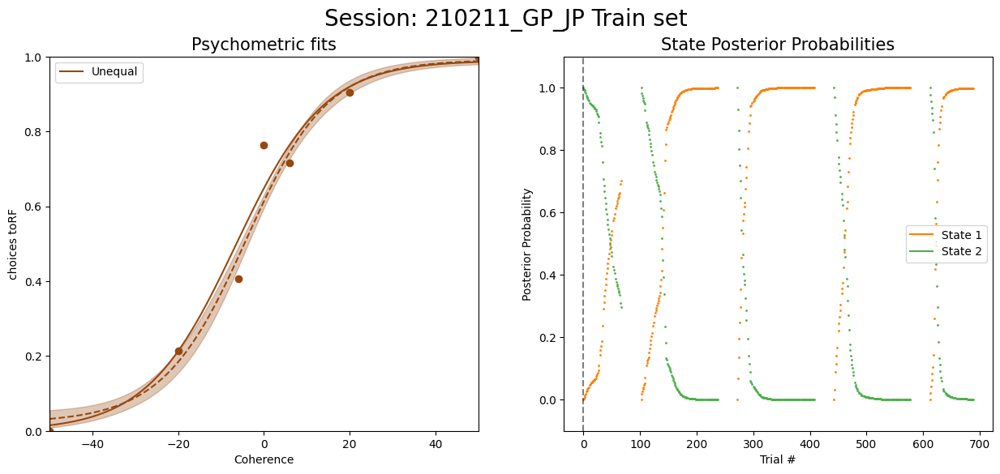

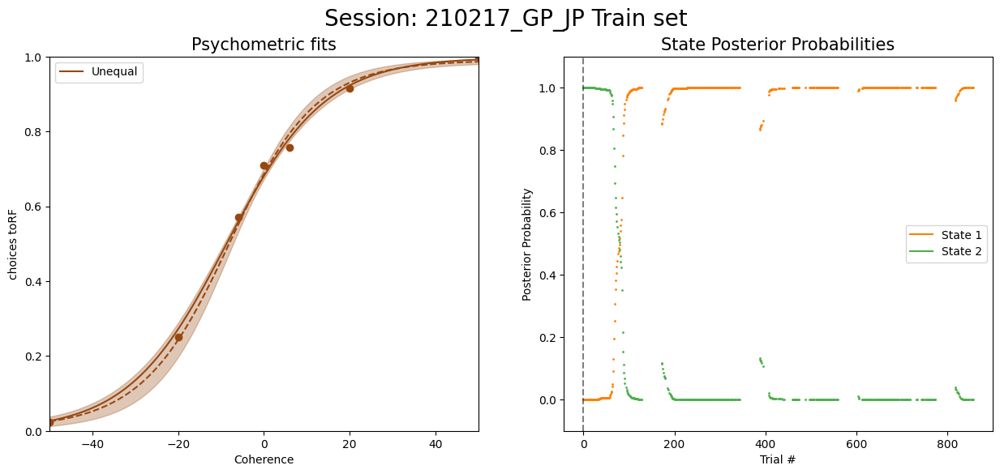

...

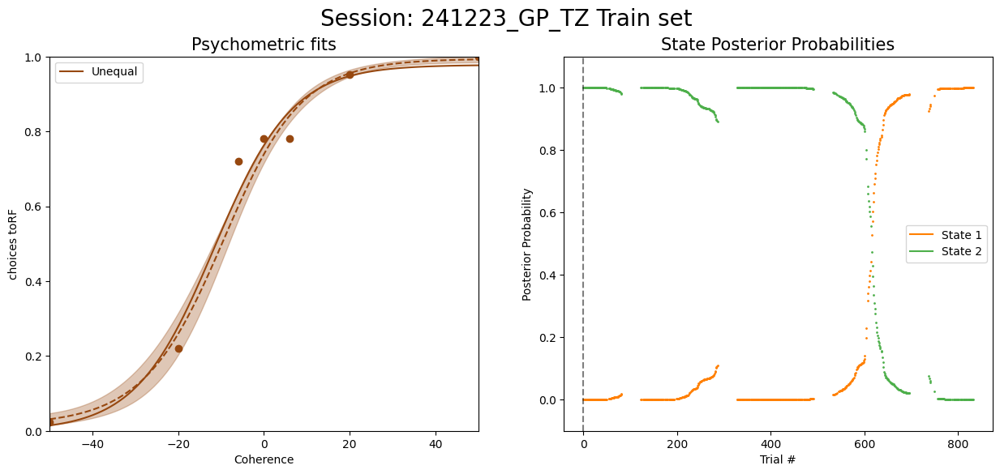

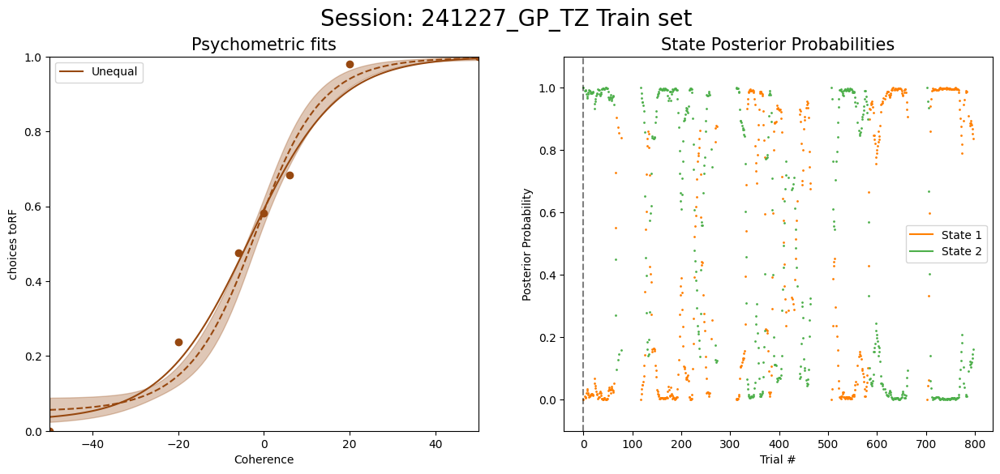

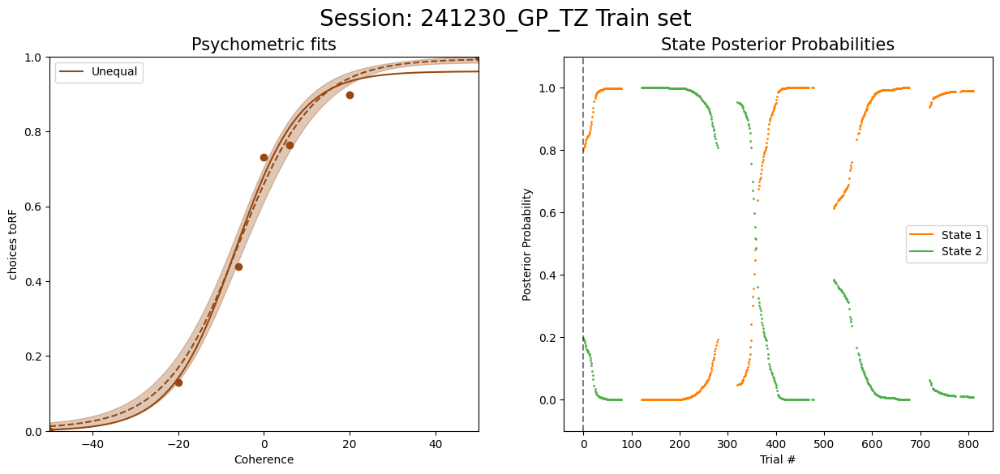

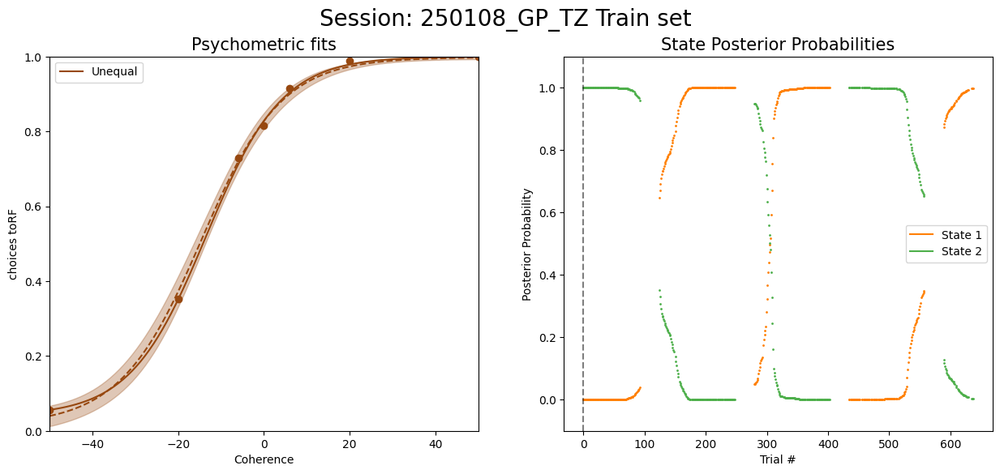

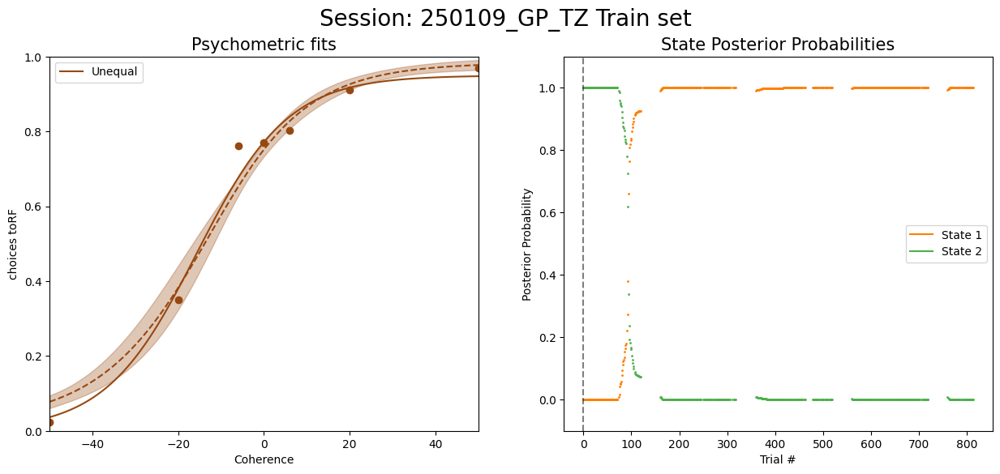

In [14]:
for idx_session, session in enumerate(session_metadata["session_id"]):

    train_idx = train_fold[session]
    model = glm_hmm["session_wise"]["models"][idx_session][best_state][best_fold_session_wise[idx_session]]
    choices = glm_hmm["data"][session]["choices"].values.reshape(-1, 1)
    if "no_bias" in _TRIALS:
        input = np.array(

            glm_hmm["data"][session][
                ["normalized_stimulus"] +
                [f"prev_choice_{t+1}" for t in range(n_trial_back)] +
                [f"prev_target_{t+1}" for t in range(n_trial_back)]
            ]
        )
    else:
        input = np.array(
            glm_hmm["data"][session][
                ["normalized_stimulus", "bias"] +
                [f"prev_choice_{t+1}" for t in range(n_trial_back)] +
                [f"prev_target_{t+1}" for t in range(n_trial_back)]
            ]
        )
    stimulus = glm_hmm["data"][session]["stimulus"]

    mask = glm_hmm["data"][session]["mask"]
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask

    prob_toRF = glm_hmm["data"][session]["prob_toRF"]
    indices = np.where((prob_toRF != 50) & ~np.isnan(prob_toRF))[0]
    task_switch = indices[0] if len(indices) > 0 else np.nan
    if _EQUAL_ONLY:
        task_switch = len(choices)
    elif _UNEQUAL_ONLY:
        task_switch = 0
    predicted_df = get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices=train_idx)
    fig, axs = plt.subplots(1, 2, figsize=(15, 6))
    plot_psych(predicted_df, task_switch,axs[0])
    plot_state_prob(predicted_df, task_switch, axs[1])
    plt.suptitle(f"Session: {session} Train set", fontsize=20)


### Test Dataset

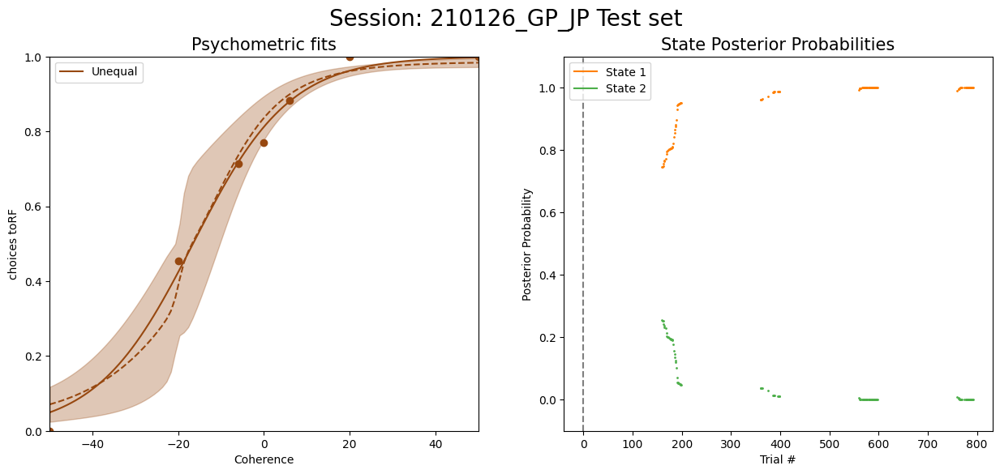

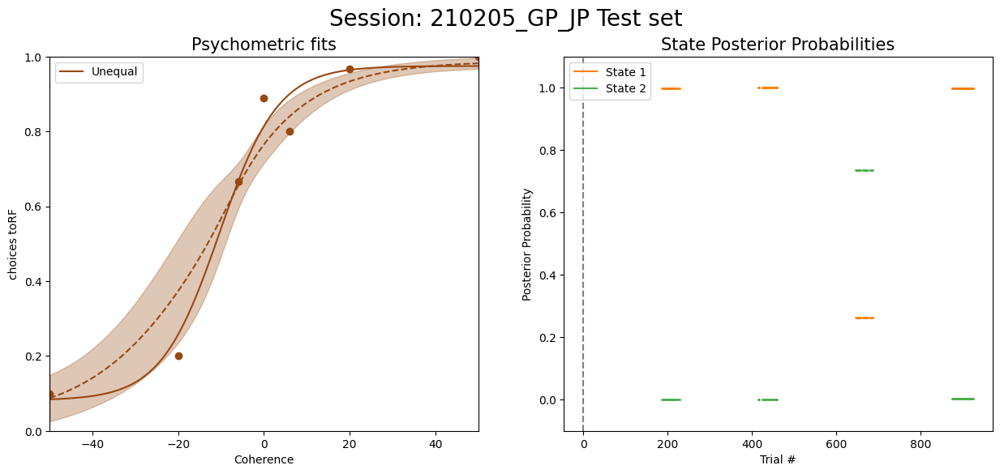

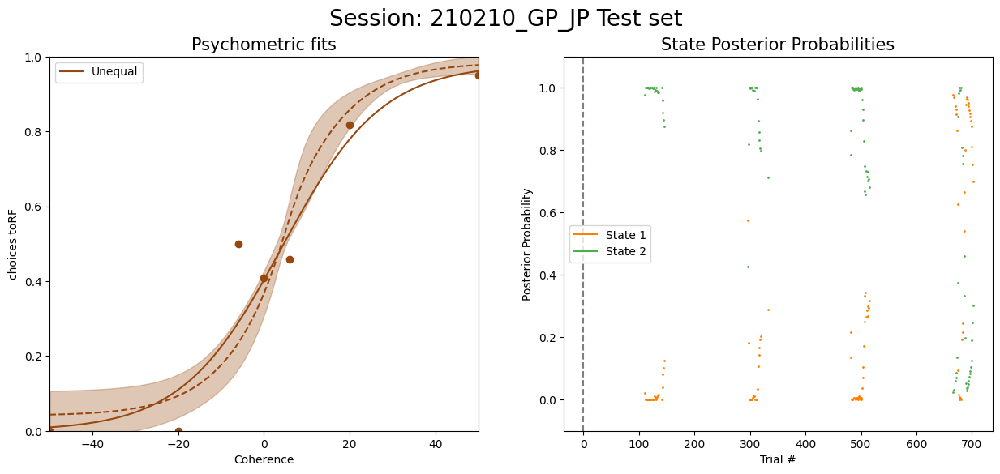

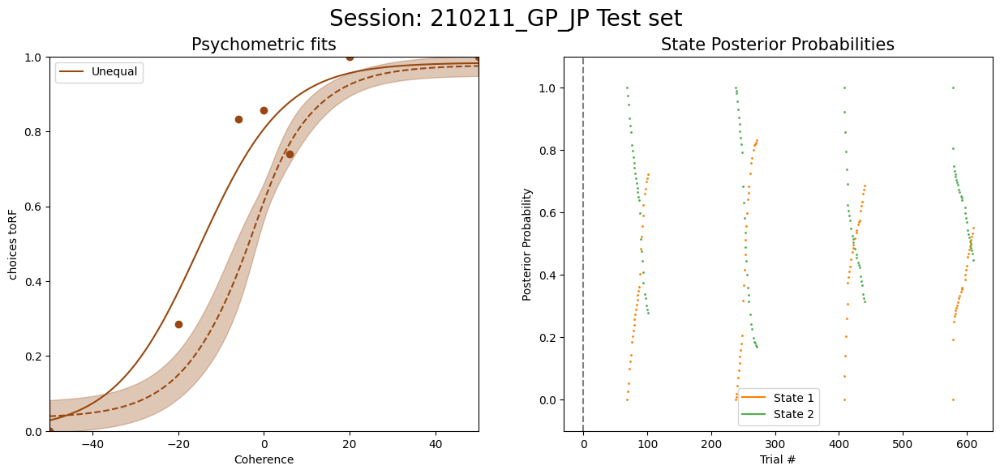

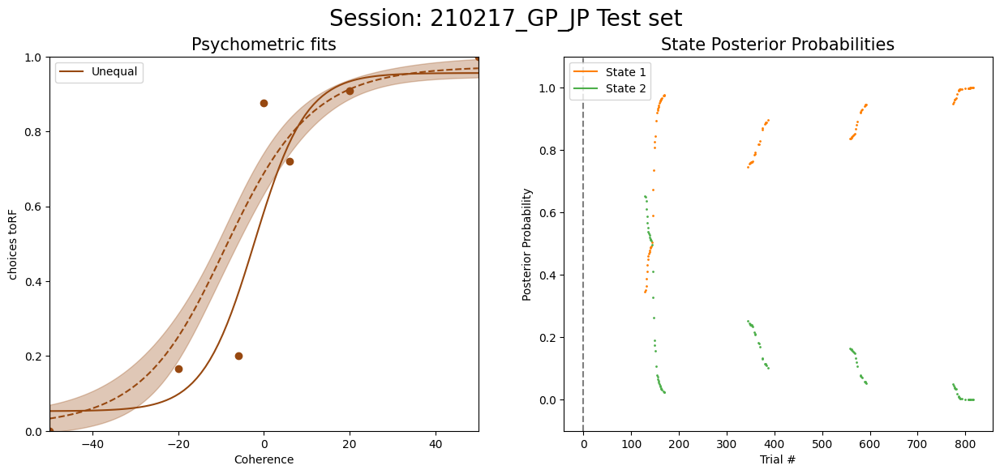

...

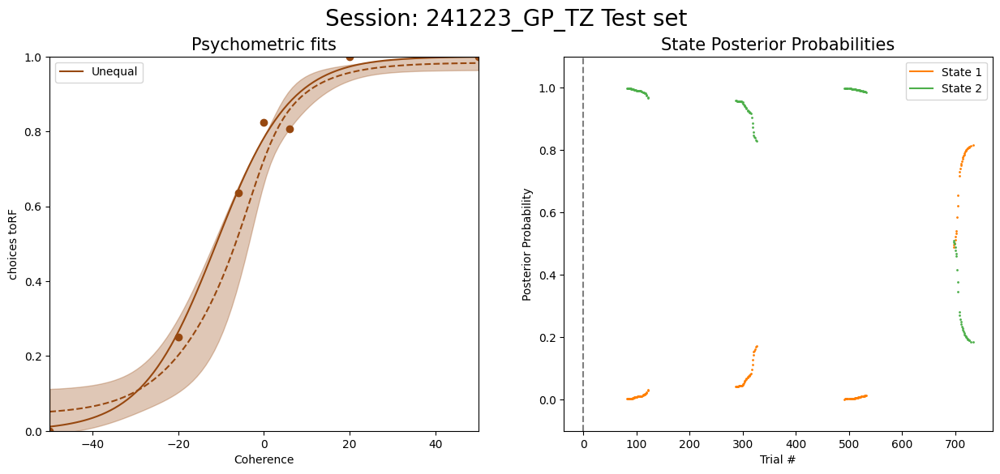

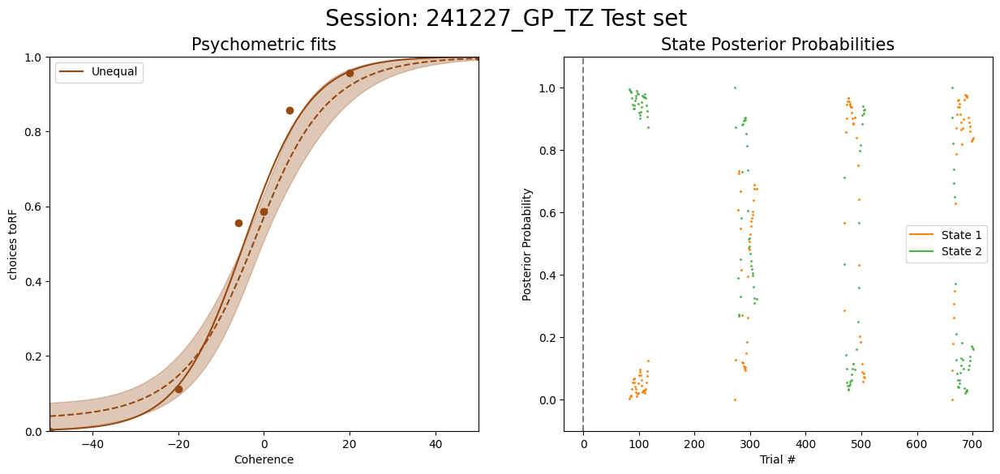

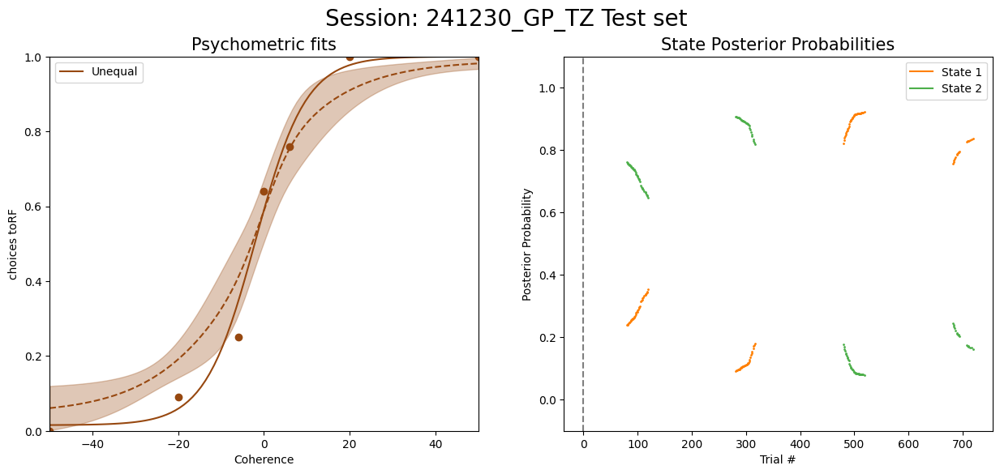

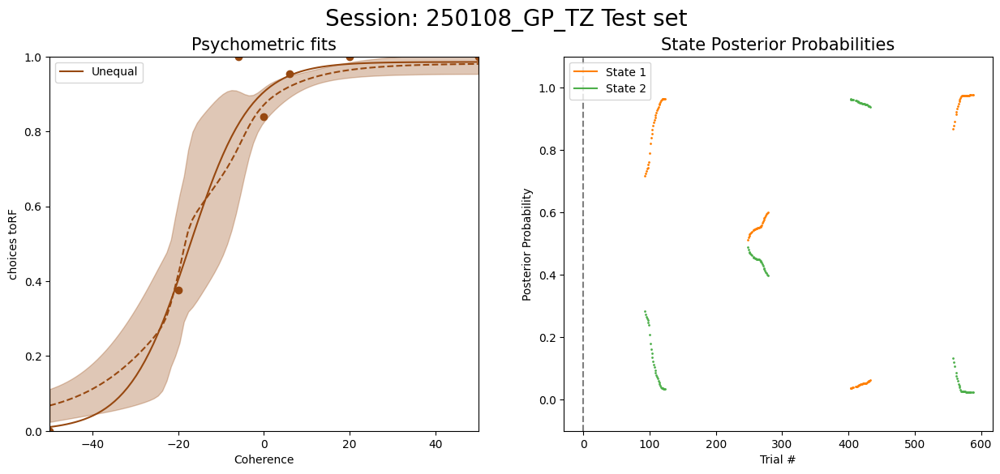

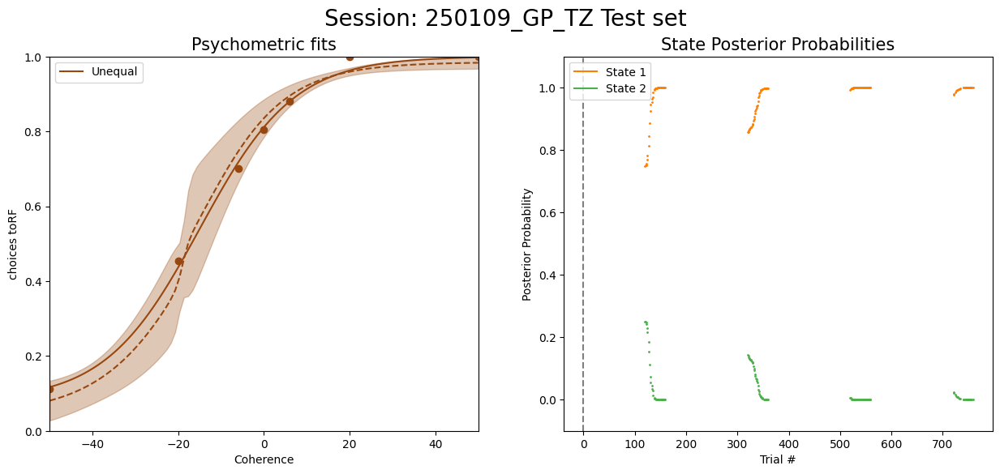

In [ ]:
for idx_session, session in enumerate(session_metadata["session_id"]):

    test_idx = test_fold[session]
    model = glm_hmm["session_wise"]["models"][idx_session][best_state][best_fold_session_wise[idx_session]]
    choices = glm_hmm["data"][session]["choices"].values.reshape(-1, 1)
    if "no_bias" in _TRIALS:
        input = np.array(

            glm_hmm["data"][session][
                ["normalized_stimulus"] +
                [f"prev_choice_{t+1}" for t in range(n_trial_back)] +
                [f"prev_target_{t+1}" for t in range(n_trial_back)]
            ]
        )
    else:
        input = np.array(
            glm_hmm["data"][session][
                ["normalized_stimulus", "bias"] +
                [f"prev_choice_{t+1}" for t in range(n_trial_back)] +
                [f"prev_target_{t+1}" for t in range(n_trial_back)]
            ]
        )
    stimulus = glm_hmm["data"][session]["stimulus"]

    mask = glm_hmm["data"][session]["mask"]
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask

    prob_toRF = glm_hmm["data"][session]["prob_toRF"]
    indices = np.where((prob_toRF != 50) & ~np.isnan(prob_toRF))[0]
    task_switch = indices[0] if len(indices) > 0 else np.nan
    if _EQUAL_ONLY:
        task_switch = len(choices)
    elif _UNEQUAL_ONLY:
        task_switch = 0
    predicted_df = get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices=test_idx)
    fig, axs = plt.subplots(1, 2, figsize=(15, 6))
    plot_psych(predicted_df, task_switch,axs[0])
    plot_state_prob(predicted_df, task_switch, axs[1])
    plt.suptitle(f"Session: {session} Test set", fontsize=20)


# Fit on whole session and save model

In [42]:
# get parameter initializations for each session
init_params = {"glm_weights": {}, "transition_matrices": {}}
choices_session_wise, inputs_session_wise, masks_session_wise = [], [], []

# choose best state and best fold model parameters to initialize
for idx_session, session in enumerate(session_metadata["session_id"]):

	init_params["glm_weights"][idx_session] = glm_hmm["session_wise"]["models"][idx_session][best_state][best_fold_session_wise[idx_session]].observations.params
	init_params["transition_matrices"][idx_session] = glm_hmm["session_wise"]["models"][idx_session][best_state][best_fold_session_wise[idx_session]].transitions.params

	choices_session_wise.append(glm_hmm["data"][session]["choices"].values.reshape(-1, 1))
	if "no_bias" in _TRIALS:
		inputs_session_wise.append(np.array(
			glm_hmm["data"][session][
				["normalized_stimulus"] +
				[f"prev_choice_{t+1}" for t in range(n_trial_back)] +
				[f"prev_target_{t+1}" for t in range(n_trial_back)]
			]
		))
	else:
		inputs_session_wise.append(np.array(
			glm_hmm["data"][session][
				["normalized_stimulus", "bias"] +
				[f"prev_choice_{t+1}" for t in range(n_trial_back)] +
				[f"prev_target_{t+1}" for t in range(n_trial_back)]
			]
		))
	masks_session_wise.append(glm_hmm["data"][session]["mask"].values.reshape(-1, 1))

In [43]:
models_session, fit_ll_session = glm_hmm_utils.session_wise_fit(choices_session_wise, inputs_session_wise, masks=masks_session_wise, n_sessions=len((session_metadata["session_id"])), init_params=init_params, n_states=best_state, n_iters=2500)

models_session_wise, fit_lls_session_wise = {}, {}
for idx_session, session_id in enumerate(session_metadata["session_id"]):
	models_session_wise[session_id] = models_session[idx_session]
	fit_lls_session_wise[session_id] = fit_ll_session[idx_session]

Fitting sessions: 100%|██████████| 45/45 [00:00<00:00, 301989.89it/s]


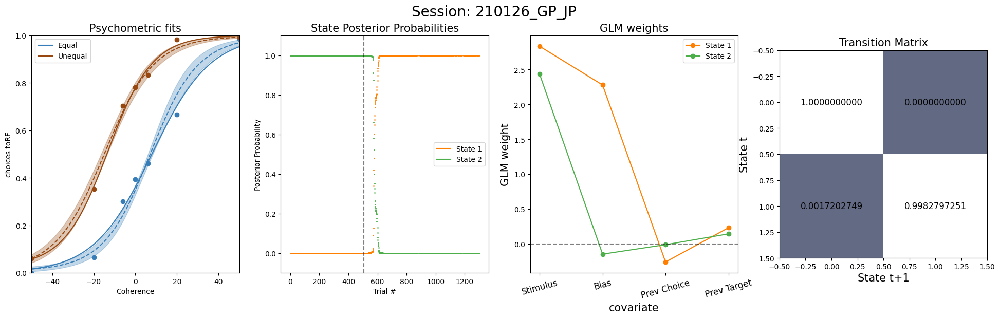

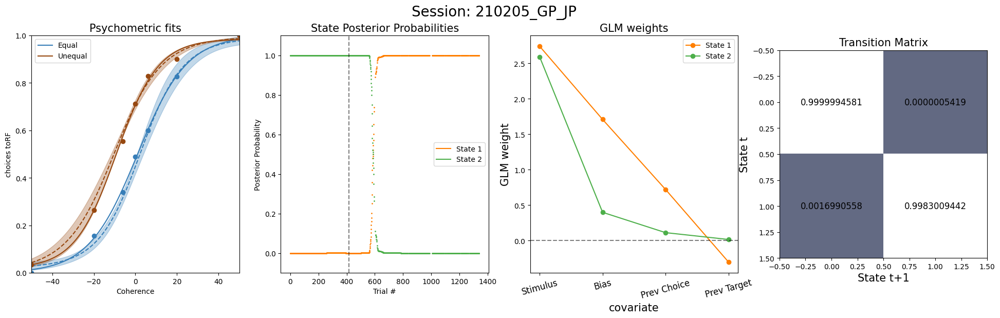

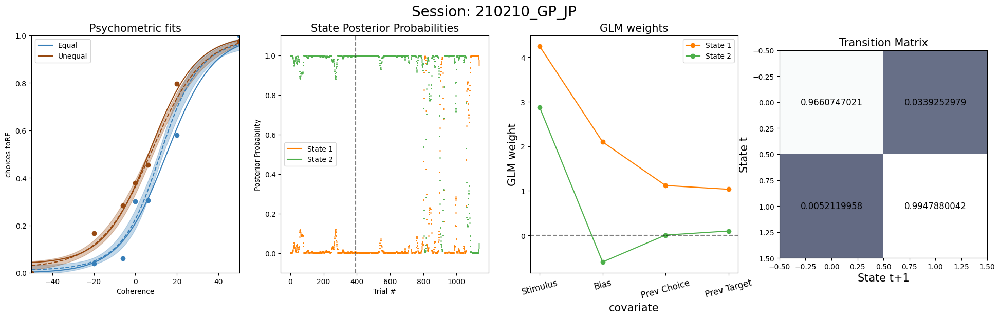

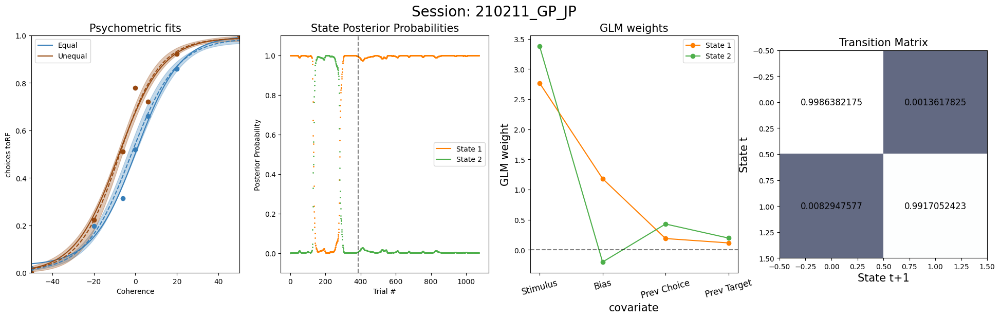

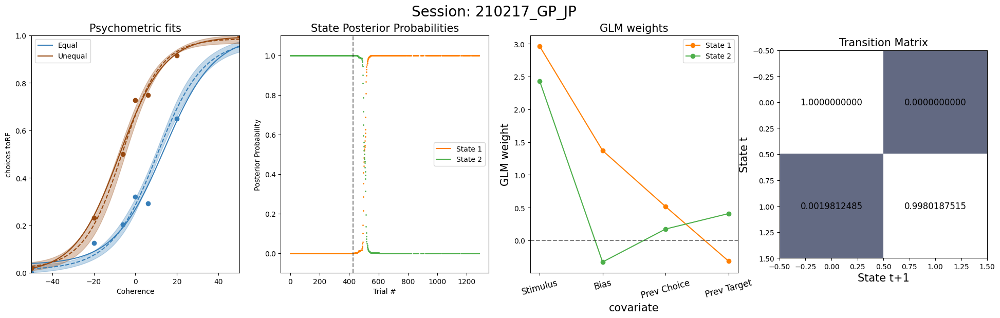

...

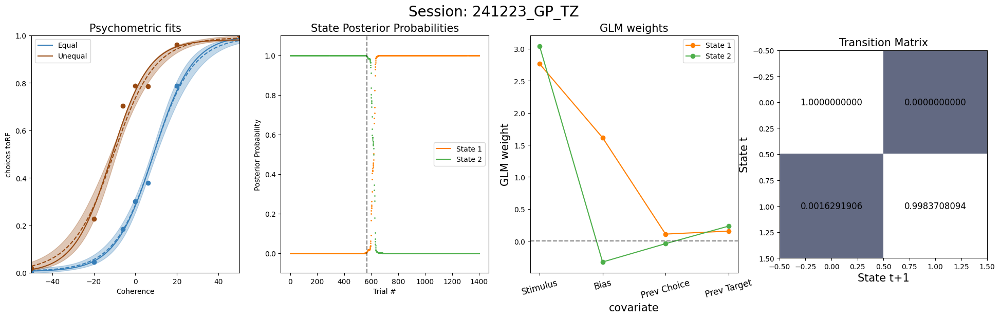

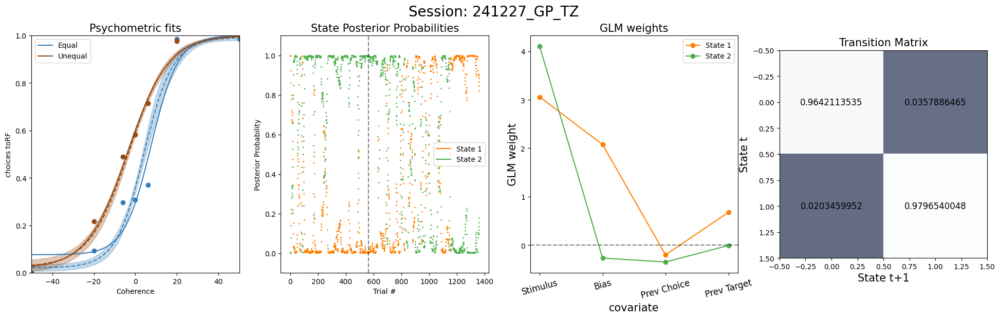

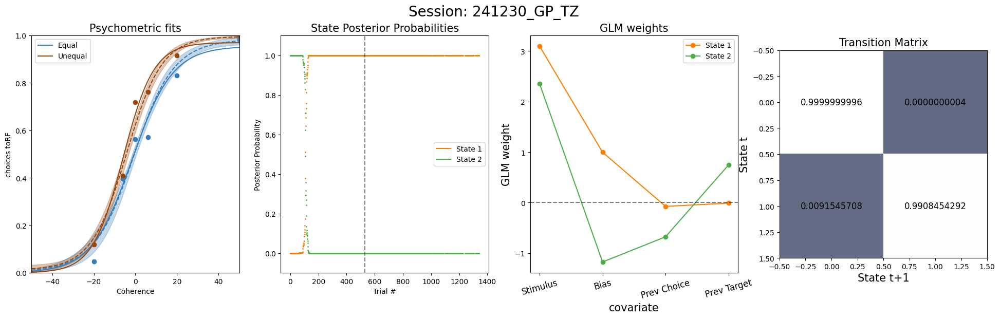

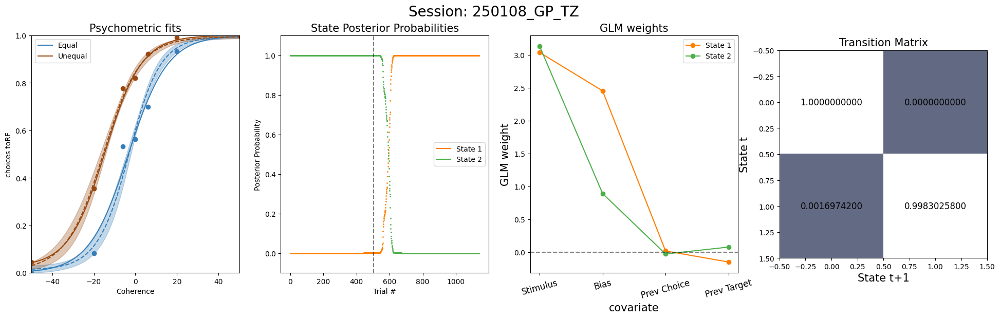

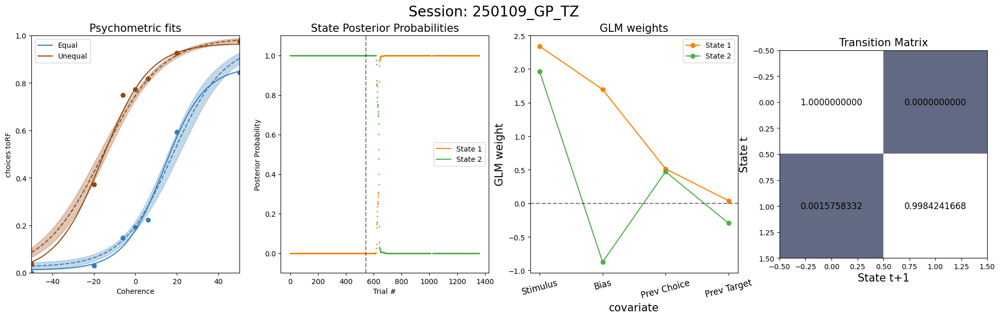

In [ ]:
for idx_session, session in enumerate(session_metadata["session_id"]):

    model = models_session_wise[session]
    choices = glm_hmm["data"][session]["choices"].values.reshape(-1, 1)
    if "no_bias" in _TRIALS:
        input = np.array(

            glm_hmm["data"][session][
                ["normalized_stimulus"] +
                [f"prev_choice_{t+1}" for t in range(n_trial_back)] +
                [f"prev_target_{t+1}" for t in range(n_trial_back)]
            ]
        )
    else:
        input = np.array(
            glm_hmm["data"][session][
                ["normalized_stimulus", "bias"] +
                [f"prev_choice_{t+1}" for t in range(n_trial_back)] +
                [f"prev_target_{t+1}" for t in range(n_trial_back)]
            ]
        )
    stimulus = glm_hmm["data"][session]["stimulus"]

    mask = glm_hmm["data"][session]["mask"]
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask

    prob_toRF = glm_hmm["data"][session]["prob_toRF"]
    indices = np.where((prob_toRF != 50) & ~np.isnan(prob_toRF))[0]
    task_switch = indices[0] if len(indices) > 0 else np.nan
    if _EQUAL_ONLY:
        task_switch = len(choices)
    elif _UNEQUAL_ONLY:
        task_switch = 0
    predicted_df = get_expected_state_choice_prob(model, choices, input, mask, stimulus, trial_indices=[np.arange(len(choices))])
    fig, axs = plt.subplots(1, 4, figsize=(24, 6))
    plot_psych(predicted_df, task_switch,axs[0])
    plot_state_prob(predicted_df, task_switch, axs[1])
    plot_model_params(model, axs[2:4])
    plt.suptitle(f"Session: {session}", fontsize=20)


NameError: name 'models_session_wise' is not defined

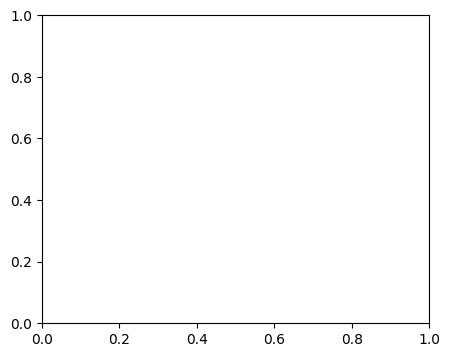

In [ ]:
fig, ax = plt.subplots(figsize=(5,4))  # Wider figure for better spacing
colors = ["#ff7f00", "#4daf4a"]  # Colors for the states
if _EQUAL_ONLY:
	labels=["State 1"]
else:
	labels = ["Biased State", "Unbiased State"]
glm_weights_session_wise = []
for idx_session, session_id in enumerate(session_metadata["session_id"]):
	model = models_session_wise[session_id]
	glm_weights = -np.array(model.observations.params).reshape(best_state, -1)
	glm_weights_session_wise.append(glm_weights)

	for k in range(best_state):
	# Determine the color and label
		ax.plot(np.arange(2+2*n_trial_back), glm_weights[k], marker="o", color=colors[k], linestyle="-", markersize=3, lw=1, alpha=0.15)
for k in range(best_state):
	mean_weights = np.mean(np.array(glm_weights_session_wise), axis=0)
	std_weights = np.std(np.array(glm_weights_session_wise), axis=0)
	ax.errorbar(np.arange(2+2*n_trial_back), mean_weights[k], yerr=std_weights[k], fmt='o', color=colors[k], markersize=5, lw=1.5, capsize=8, elinewidth=3)

	ax.plot(np.arange(2+2*n_trial_back), np.mean(np.array(glm_weights_session_wise), axis=0)[k], marker="o", color=colors[k], linestyle="-", markersize=10, lw=3, label=labels[k])

# Formatting
ax.tick_params(axis="y", labelsize=10)
ax.set_ylabel("GLM Weights", fontsize=18)
ax.set_xlabel("Covariates", fontsize=18)
ax.set_xticks(range(2+2*n_trial_back))
# ax.set_ylim([-2, 5])
labels = ["Stimulus", "Bias"] \
	+ [f"Prev Choice "] \
	+ [f"Prev Target"]

ax.set_xticklabels(labels, fontsize=15, rotation=15)
# ax.set_yticks(np.arange(-2, 8, 2))
ax.tick_params(axis='y', which='major', labelsize=15)
ax.axhline(y=0, color="k", alpha=0.5, ls="--")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(fontsize=12, loc='upper right')

plt.show()

In [34]:
# store data and models for session-wise
session_wise_fits = {
	"models": models_session_wise,
	"fit_lls": fit_lls_session_wise,
}

models_and_data = {
	"model": session_wise_fits,
	"data": glm_hmm["data"],
}

with open(Path(processed_dir, f"glm_hmm_{_TRIALS}_final.pkl"), "wb") as f:
	pickle.dump(models_and_data, f)